In [1]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="3tlvefgVdN8H498UwE8s")
project = rf.workspace("lab2-kvwo0").project("lab2-ezqm7")
version = project.version(3)
dataset = version.download("yolov8")
                

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.9/80.9 kB 3.6 MB/s eta 0:00:00
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to lab2-3 in yolov8:: 100%|██████████| 2690/2690 [00:00<00:00, 9432.99it/s]


In [2]:
# Define a function to write text to a file
def write_text_to_file(text, file_path):
    with open(file_path, 'w') as file:
        file.write(text)


text="""
train: /kaggle/working/lab2-3/train/images
val: /kaggle/working/lab2-3/valid/images
test: /kaggle/working/lab2-3/test/images

nc: 3
names: ['kivi', 'lemon', 'pineapple']

roboflow:
  workspace: lab2-kvwo0
  project: lab2-ezqm7
  version: 3
  license: CC BY 4.0
  url: https://universe.roboflow.com/lab2-kvwo0/lab2-ezqm7/dataset/3

"""

write_text_to_file(text, "output.yaml")

In [3]:
%pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics 8.3.39 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 5933.9/8062.4 GB disk)


In [4]:
!yolo task= segment mode= train data=/kaggle/working/output.yaml model=yolov8l-seg.pt epochs=30 imgsz=640 batch=16

100%|██████████████████████████████████████| 88.1M/88.1M [00:01<00:00, 83.6MB/s]
Ultralytics 8.3.39 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=segment, mode=train, model=yolov8l-seg.pt, data=/kaggle/working/output.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, s

In [5]:
!yolo task= segment mode= train data=/kaggle/working/output.yaml model=/kaggle/working/runs/segment/train/weights/best.pt epochs=20 imgsz=640 batch=16

Ultralytics 8.3.39 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=segment, mode=train, model=/kaggle/working/runs/segment/train/weights/best.pt, data=/kaggle/working/output.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=Fa

In [6]:
from IPython.display import Image, display

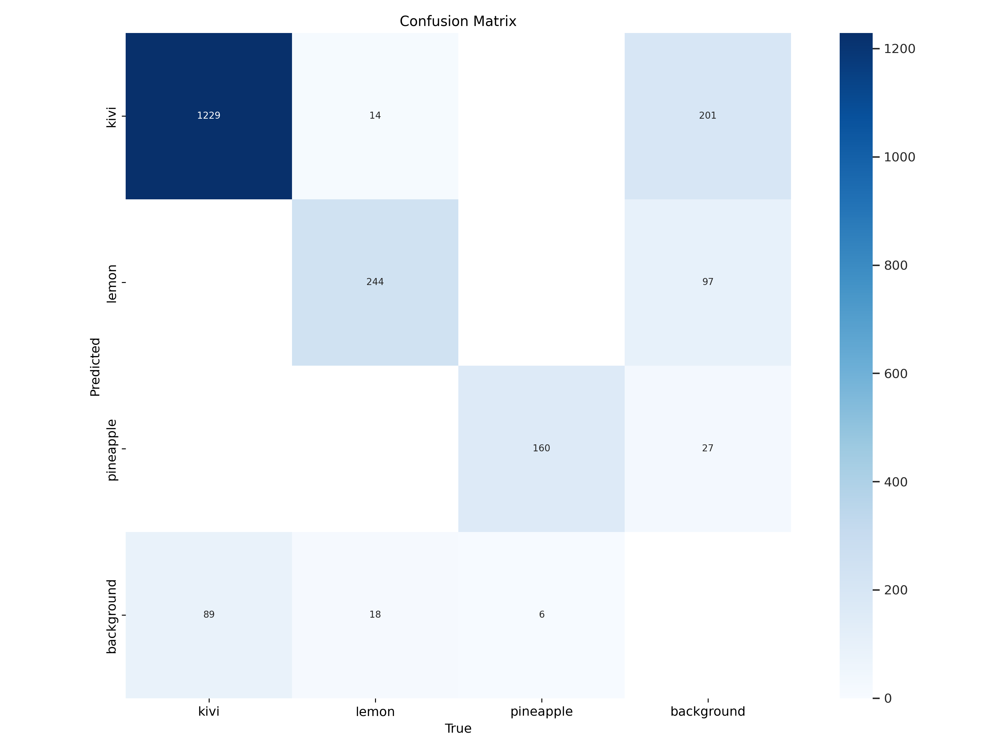

In [7]:
display(Image(filename=f"/kaggle/working/runs/segment/train2/confusion_matrix.png", width=1000))

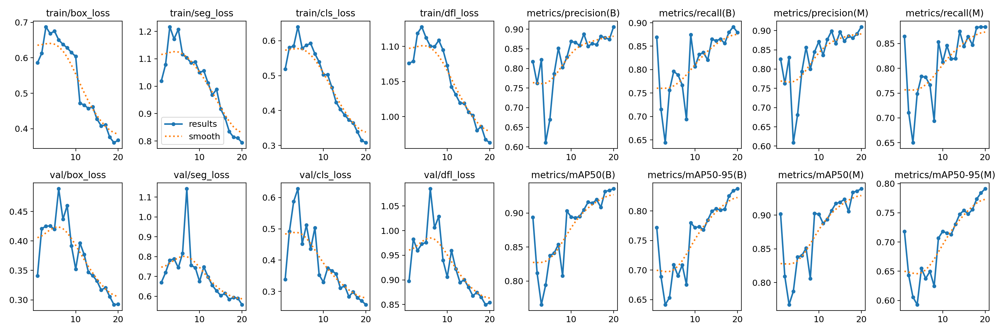

In [8]:
display(Image(filename=f"/kaggle/working/runs/segment/train2/results.png", width=1000))

In [9]:
!yolo task=segment mode=predict model=/kaggle/working/runs/segment/train2/weights/best.pt imgsz=640 conf=0.5 \
source=/kaggle/working/lab2-3/test/images

Ultralytics 8.3.39 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv8l-seg summary (fused): 295 layers, 45,914,201 parameters, 0 gradients, 220.1 GFLOPs

image 1/137 /kaggle/working/lab2-3/test/images/101_100_jpg.rf.9faa83ff9dc4691695e855a7c72e69ec.jpg: 640x640 1 pineapple, 30.4ms
image 2/137 /kaggle/working/lab2-3/test/images/103_100_jpg.rf.da59a6acab793633c12af2fe59d210b2.jpg: 640x640 1 lemon, 30.5ms
image 3/137 /kaggle/working/lab2-3/test/images/104_100_jpg.rf.0796efdbe22e32ff665d6f3cdc05c4ba.jpg: 640x640 1 pineapple, 30.4ms
image 4/137 /kaggle/working/lab2-3/test/images/106_100_jpg.rf.3012cd80630bc2e98f9182dcf617329a.jpg: 640x640 1 lemon, 30.4ms
image 5/137 /kaggle/working/lab2-3/test/images/108_100_jpg.rf.cb888f82e1ef322a4ee021b4aedb3fcd.jpg: 640x640 1 lemon, 30.2ms
image 6/137 /kaggle/working/lab2-3/test/images/109_100_jpg.rf.3ff8d3eed22afe7e6791778727a95883.jpg: 640x640 1 lemon, 28.3ms
image 7/137 /kaggle/working/lab2-3/test/images/109_100_jpg.rf.9453648

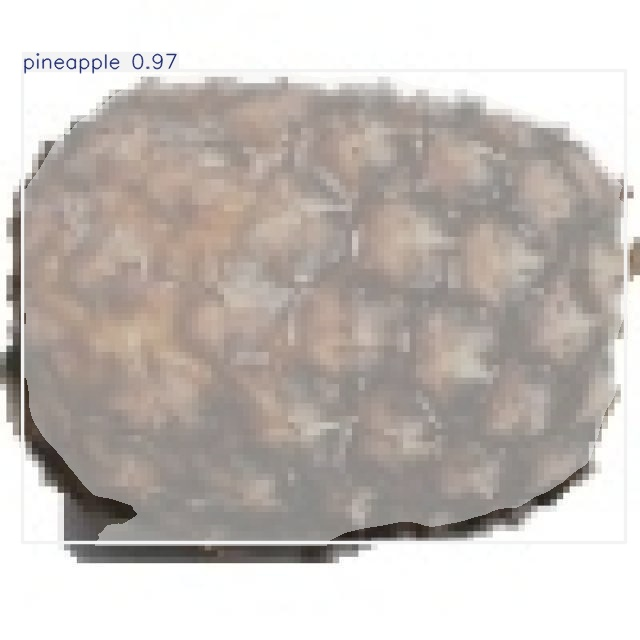

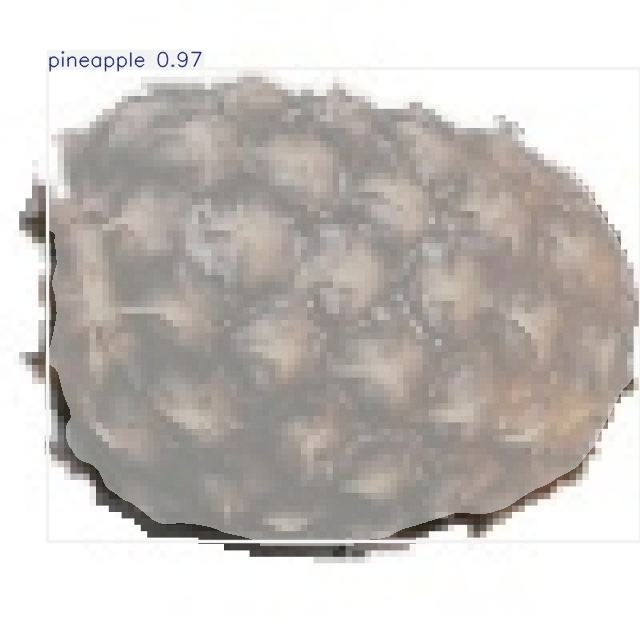

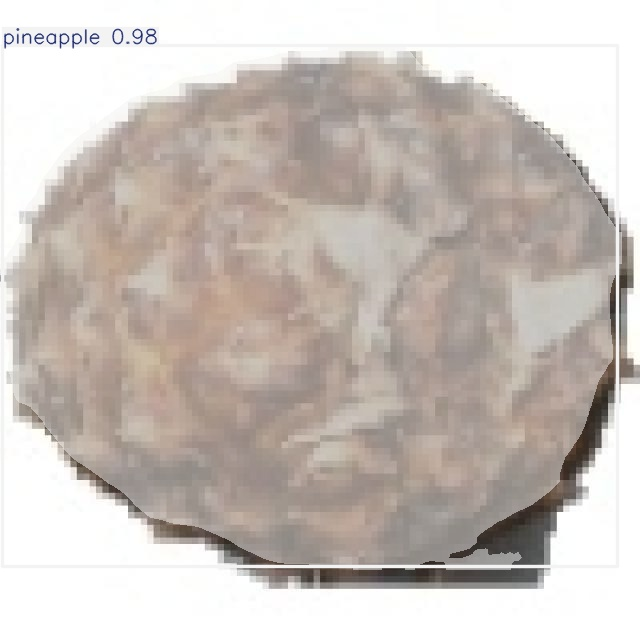

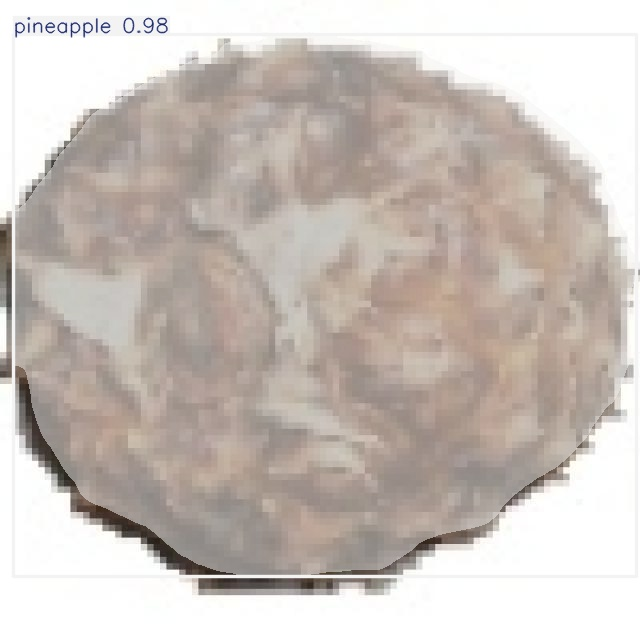

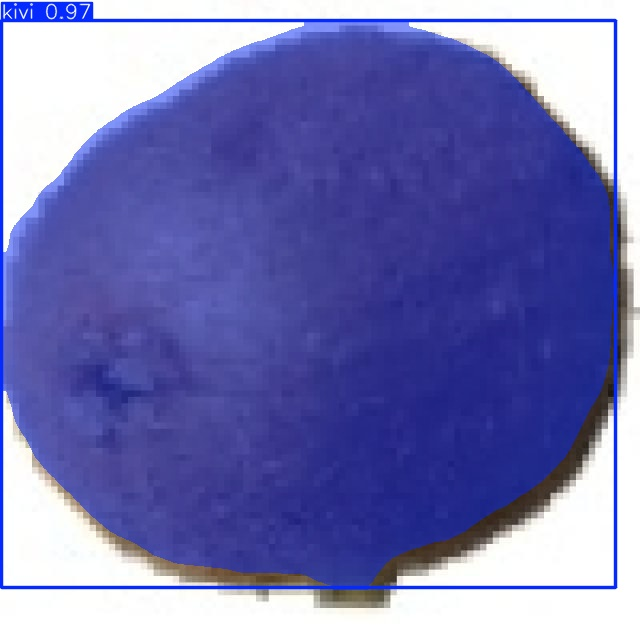

...

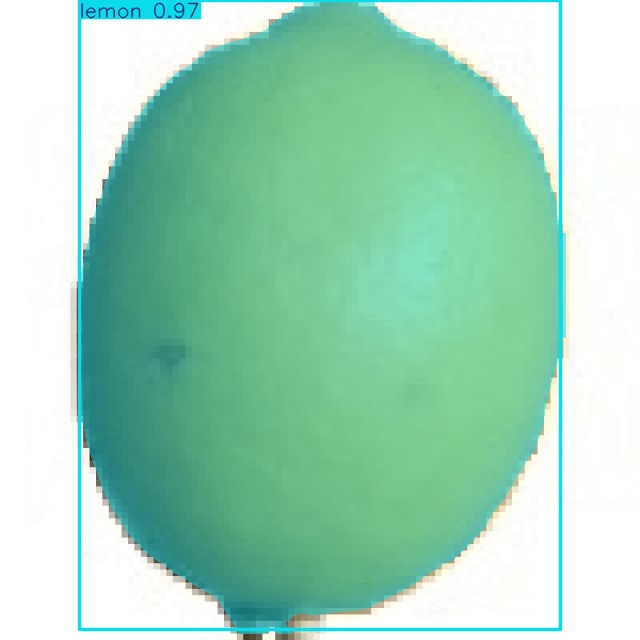

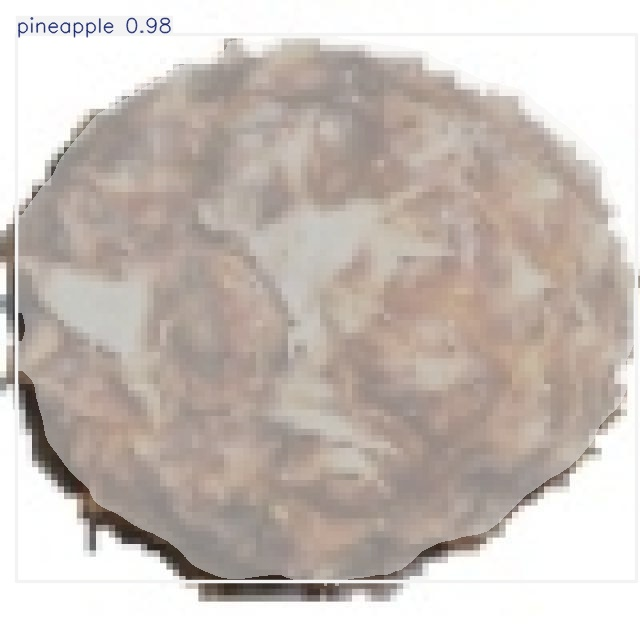

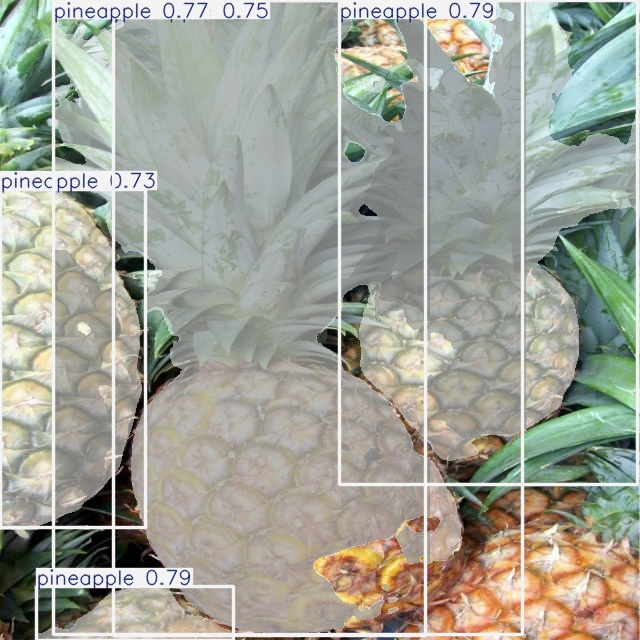

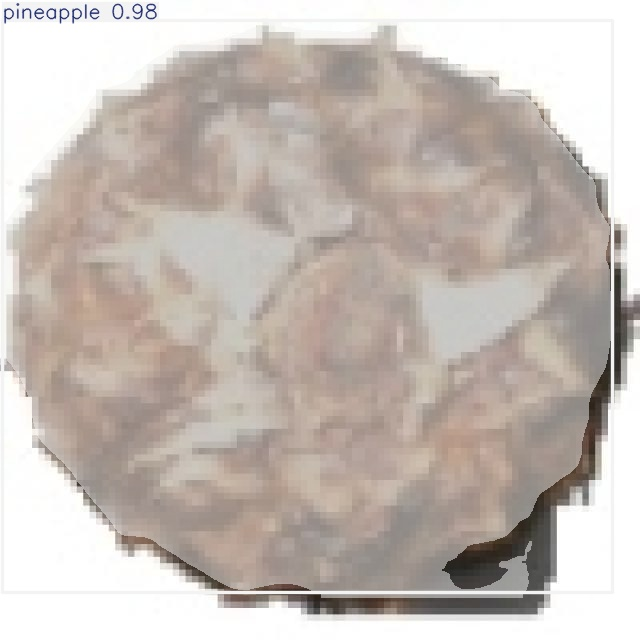

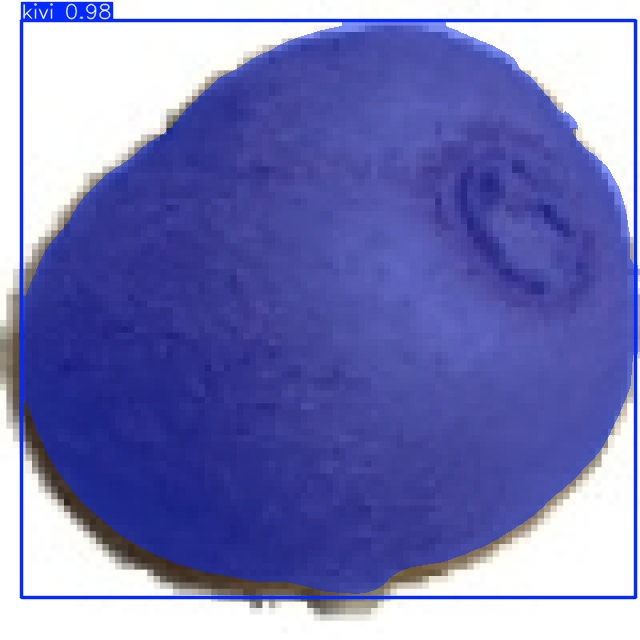

In [11]:
# Display inference on ALL test images
import glob
from IPython.display import Image, display
i = 0
for imageName in glob.glob("/kaggle/working/runs/segment/predict/*.jpg"): #assuming JPG
    # if i %15 ==0 :
    print("\n")
    display(Image(filename=imageName))
    i = i +1

